<a href="https://colab.research.google.com/github/cactus1386/NationalCard-ImageProccessing/blob/main/main2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Install and import Libraries

In [1]:
! pip install ultralytics hezar insightface onnxruntime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 439.5/439.5 kB 27.9 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 67.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 195.2/195.2 kB 20.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.4/16.4 MB 109.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 120.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 89.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 56.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.4 MB/s

In [2]:

import torch
print(torch.cuda.is_available())

True


In [3]:
import cv2
import numpy as np
from ultralytics import YOLO
from google.colab.patches import cv2_imshow
import os
import pandas as pd
import re
from hezar.models import Model
from insightface.app import FaceAnalysis

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.7' (you have '2.0.6'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [4]:
!git clone https://github.com/cactus1386/NationalCard-ImageProccessing.git

Cloning into 'NationalCard-ImageProccessing'...
remote: Enumerating objects: 655, done.
remote: Counting objects: 100% (42/42), done.
remote: Compressing objects: 100% (35/35), done.
remote: Total 655 (delta 17), reused 20 (delta 6), pack-reused 613 (from 2)
Receiving objects: 100% (655/655), 219.67 MiB | 16.08 MiB/s, done.
Resolving deltas: 100% (202/202), done.


# Read kibord dataset

In [ ]:
import gdown
import zipfile
import os

In [ ]:
file_id = "1EP7JhNFoLtlmJCabhrpTYOkMJ2c_OyMM"
dataset_zip_path = "/content/dataset.zip"
extract_path = "/content/dataset"

In [ ]:
gdown.download(f"https://drive.google.com/uc?id={file_id}", dataset_zip_path, quiet=False)

with zipfile.ZipFile(dataset_zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("✅ Dataset downloaded and extracted successfully!")


Downloading...
From (original): https://drive.google.com/uc?id=1EP7JhNFoLtlmJCabhrpTYOkMJ2c_OyMM
From (redirected): https://drive.google.com/uc?id=1EP7JhNFoLtlmJCabhrpTYOkMJ2c_OyMM&confirm=t&uuid=6f05fa74-3d7e-462a-99b3-fd8490a30692
To: /content/dataset.zip
100%|██████████| 539M/539M [00:10<00:00, 52.7MB/s]


✅ Dataset downloaded and extracted successfully!


In [ ]:
print("Sample files:", os.listdir(extract_path)[:5])

Sample files: ['2832.PNG', '1443.jpg', '650.PNG', '5.PNG', '1601.jpg']


# Set model and path

In [5]:
detector = FaceAnalysis(name='buffalo_l') # set face detector
detector.prepare(ctx_id=0, det_size=(640, 640))
objects_model = YOLO('/content/NationalCard-ImageProccessing/models/TextDetection.pt') # set yolo model for object detection
card_model = YOLO('/content/NationalCard-ImageProccessing/models/CardDetection.pt') # set yolo model for card detection
seg_model = YOLO("/content/NationalCard-ImageProccessing/models/card_segmentation.pt") # set yolo model for segmentation
logo_model = YOLO('/content/NationalCard-ImageProccessing/models/RotateIDCard.pt')
path = '/content/NationalCard-ImageProccessing/models' # set path for finetuned ocr
hezar = Model.load("hezarai/crnn-fa-printed-96-long") # set hezar ocr model
hezar.save(path)
hezar_ocr = Model.load(path)

download_path: /root/.insightface/models/buffalo_l


100%|██████████| 281857/281857 [00:03<00:00, 92051.04KB/s]
/usr/local/lib/python3.11/dist-packages/onnxruntime/capi/onnxruntime_inference_collection.py:121: UserWarning: Specified provider 'CUDAExecutionProvider' is not in available provider names.Available providers: 'AzureExecutionProvider, CPUExecutionProvider'
  warnings.warn(


Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/2d106det.onnx landmark_2d_106 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/det_10g.onnx detection [1, 3, '?', '?'] 127.5 128.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/genderage.onnx genderage ['None', 3, 96, 96] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/w600k_r50.onnx recognition ['None', 3, 112, 112] 127.5 127.5
set det-size: (640, 640)


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_config.yaml:   0%|          | 0.00/837 [00:00<?, ?B/s]

model.pt:   0%|          | 0.00/37.2M [00:00<?, ?B/s]

image_processor_config.yaml:   0%|          | 0.00/153 [00:00<?, ?B/s]

# Rotation Code

In [14]:
def rotation(path):
    image = cv2.imread(path) # set image
    cropped_card = segmentation_perspective(image)
    # detect face in the cropped card
    faces = detector.get(cropped_card)

    # check for faces
    if faces:
        x1, y1, x2, y2 = map(int, faces[0]['bbox'])  # get face bounding box
        w, h = x2 - x1, y2 - y1
        face_center = (x1 + w // 2, y1 + h // 2)  # face center
        card_center = (cropped_card.shape[1] // 2, cropped_card.shape[0] // 2)  # card center

        # calculate rotation angle
        angle = np.arctan2(face_center[1] - card_center[1], face_center[0] - card_center[0]) * (180 / np.pi) + 180
        rotation_matrix = cv2.getRotationMatrix2D(card_center, angle, 1.0)
        rotated = cv2.warpAffine(cropped_card, rotation_matrix, (cropped_card.shape[1], cropped_card.shape[0]))

        # rotated_per = segmentation_perspective(rotated)

        return rotated  # return image

    corrected_card = segmentation_perspective(cropped_card)

    return corrected_card  # if cant find face


# Use other model for text detection (Hezar)

In [7]:
def process_img(img):
    data = {}
    results = objects_model(img) # set part of object detection yolo model

    # dict for each box conf
    box_confidences = {}

    for result in results:
        boxes = result.boxes
        for box in boxes:
            xyxy = box.xyxy[0]
            x1, y1, x2, y2 = map(int, xyxy.tolist()) # set corner locations
            label = result.names[int(box.cls)] # set label
            conf = float(box.conf)  # set conf

            cropped_img = img[max(0, y1-3):y2+3, max(0, x1-3):x2+3] # cropped image location (with more nums for better conf)
            cv2_imshow(cropped_img)

            ocr_result = hezar_ocr.predict(cropped_img)  # read text with ocr

            if ocr_result:  # check if OCR returned results
                text_list = []
                for item in ocr_result:
                    text_list.append(item['text'])
                text = " ".join(text_list)  # retrun text
            else:
                text = "" # return empty str

            # best conf text (if have more than one)
            if label in box_confidences:
                if conf > box_confidences[label][1]:
                    box_confidences[label] = (text, conf)
            else:
                box_confidences[label] = (text, conf)

    # print label, text and conf
    for label, (text, conf) in box_confidences.items():
        print(f"Label: {label}, Text: {text}, Confidence: {conf}")
        data[label] = text.strip()

    return data

# Perspective

In [8]:
def segmentation_perspective(image):
    # run segmentation model to detect objects and their masks
    results = seg_model(image)

    for r in results:
        masks = r.masks
        if masks is not None:  # check if any masks were detected
            for mask in masks.xy:  # process each mask coordinates
                # convert mask points to integer array for OpenCV
                pts = np.array(mask, dtype=np.int32)

                # get image dimensions and create a blank binary mask
                height, width = image.shape[:2]
                mask_binary = np.zeros((height, width), dtype=np.uint8)
                # fill the mask area with white (255)
                cv2.fillPoly(mask_binary, [pts], 255)

                # find contours in the binary mask and select the largest one
                contours, _ = cv2.findContours(mask_binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
                contour = max(contours, key=cv2.contourArea)

                # approximate the contour to a polygon
                epsilon = 0.02 * cv2.arcLength(contour, True)  # precision for approximation
                approx = cv2.approxPolyDP(contour, epsilon, True)

                # check if the shape has exactly 4 corners
                if len(approx) == 4:
                    # reshape and sort corners: top-left, top-right, bottom-right, bottom-left
                    corners = approx.reshape(4, 2)
                    corners = sorted(corners, key=lambda x: x[1])  # sort by y-coordinate
                    top_corners = sorted(corners[:2], key=lambda x: x[0])  # sort top by x
                    bottom_corners = sorted(corners[2:], key=lambda x: x[0])  # sort bottom by x
                    ordered_corners = [top_corners[0], top_corners[1], bottom_corners[1], bottom_corners[0]]

                    # calculate bounding rectangle and aspect ratio
                    x, y, w, h = cv2.boundingRect(contour)
                    aspect_ratio = w / h
                    # set output size based on aspect ratio
                    if aspect_ratio > 1:  # wider than tall
                        width = 1180
                        height = int(width / aspect_ratio)
                    else:  # taller than wide
                        height = 750
                        width = int(height * aspect_ratio)

                    # define ideal rectangular coordinates for the output
                    ideal_coords = np.array([[0, 0], [width, 0], [width, height], [0, height]], dtype="float32")

                    # compute perspective transformation matrix
                    matrix = cv2.getPerspectiveTransform(np.array(ordered_corners, dtype="float32"), ideal_coords)

                    # apply sharpening filter to enhance edges
                    kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])
                    sharpened = cv2.filter2D(image, -1, kernel)

                    # warp the sharpened image to the corrected perspective
                    corrected_image = cv2.warpPerspective(sharpened, matrix, (width, height), flags=cv2.INTER_LANCZOS4)

                    # display the result
                    cv2_imshow(corrected_image)
                    cv2.imwrite('/content/test/test.jpg', corrected_image)
                    return corrected_image
                else:
                    # return original image if shape isnt a quadrilateral
                    return image
        else:
            # return original image if no masks are detected
            return image

# Call function and use it

In [9]:
def detect(folder):
    detected = []  # لیست برای ذخیره داده‌ها
    processed_count = 0  # شمارنده عکس‌های بررسی‌شده

    for img in os.listdir(folder):
        if img.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.heic')):
            processed_count += 1  # افزایش شمارنده

            # چاپ تعداد عکس‌های بررسی‌شده هر 10 تا
            if processed_count % 10 == 0:
                print(f"تعداد عکس‌های بررسی‌شده: {processed_count}")

            img_path = os.path.join(folder, img)
            data = {'image_id': img.split('.')[0], 'national_id': '', 'first_name': '', 'last_name': '',
                    'birth_year': '', 'birth_month': '', 'birth_day': '', 'father_name': '',
                    'expiry_year': '', 'expiry_month': '', 'expiry_day': ''}

            # چرخش و برش کارت
            card = rotation(img_path)
            if card is None:
                continue

            # استخراج داده از تصویر برش‌خورده
            extracted_data = process_img(card)

            # پر کردن دیکشنری با داده‌ها
            for key, value in extracted_data.items():
                value = re.sub(r'\s+', ' ', value).strip()
                if key == 'Expire':
                    try:
                        y, m, d = value.split('/')
                        data['expiry_year'], data['expiry_month'], data['expiry_day'] = y, m, d
                    except ValueError:
                        print(f"Error splitting Expire: {value}")
                elif key == 'Birth':
                    try:
                        y, m, d = value.split('/')
                        data['birth_year'], data['birth_month'], data['birth_day'] = y, m, d
                    except ValueError:
                        print(f"Error splitting Birth: {value}")
                elif key == 'National':
                    data['national_id'] = value
                elif key == 'Name':
                    data['first_name'] = value
                elif key == 'LastName':
                    data['last_name'] = value
                elif key == 'FatherName':
                    data['father_name'] = value

            detected.append(data)

            # ذخیره هر 100 داده در CSV
            if len(detected) % 100 == 0:
                pd.DataFrame(detected).to_csv('image_phase2_temp.csv', index=False, encoding='utf-8')
                print(f"ذخیره شد: {len(detected)} داده در فایل موقت")

    # ذخیره نهایی همه داده‌ها (شامل باقی‌مانده‌ها که به 100 نرسیده‌اند)
    if detected:
        pd.DataFrame(detected).to_csv('image_phase2.csv', index=False, encoding='utf-8')
        print(f"ذخیره نهایی: {len(detected)} داده در فایل اصلی")

    return detected


0: 480x640 1 Card, 53.0ms
Speed: 6.2ms preprocess, 53.0ms inference, 3.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 Births, 1 Expire, 1 FatherName, 1 National, 14.0ms
Speed: 4.0ms preprocess, 14.0ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


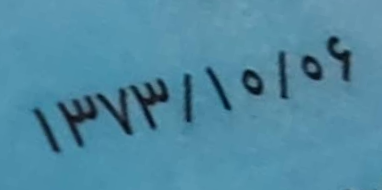

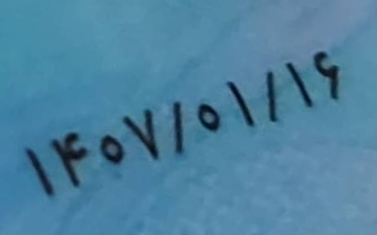

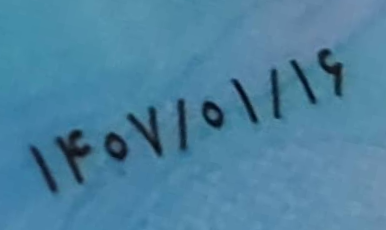

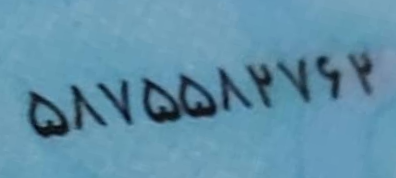

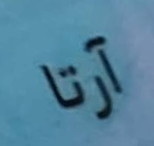

Label: Birth, Text: ۱۳۱۳۱۷۰۱۰۶, Confidence: 0.7631386518478394
Label: Expire, Text: ۴۰۱۰۷۱۱۶, Confidence: 0.6085870265960693
Label: National, Text: ۶۴،پالح%اه, Confidence: 0.2898156940937042
Label: FatherName, Text: ا, Confidence: 0.27673158049583435
Error splitting Birth: ۱۳۱۳۱۷۰۱۰۶
Error splitting Expire: ۴۰۱۰۷۱۱۶

0: 480x640 1 Card, 15.1ms
Speed: 4.8ms preprocess, 15.1ms inference, 2.7ms postprocess per image at shape (1, 3, 480, 640)


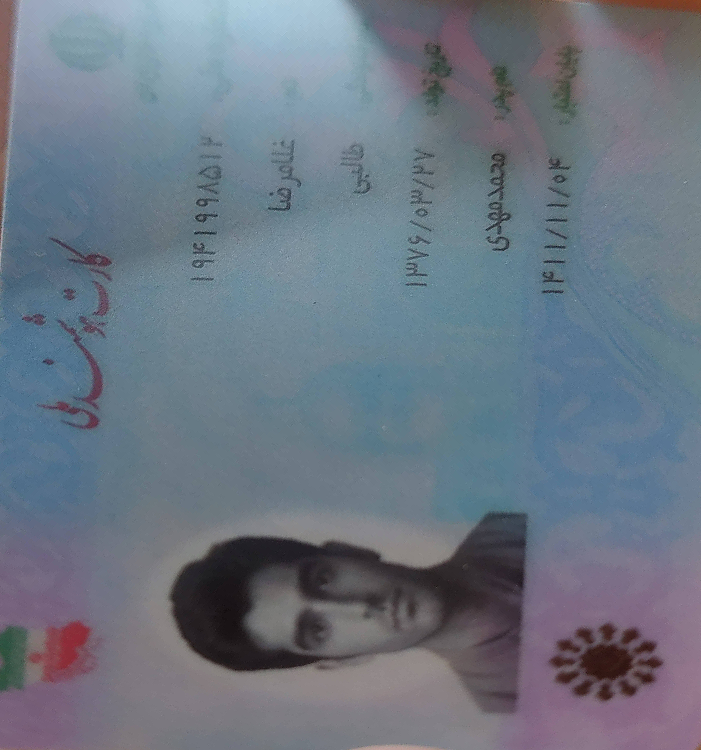


0: 640x608 1 Birth, 1 Expire, 1 FatherName, 1 LastName, 1 Name, 1 National, 22.2ms
Speed: 4.2ms preprocess, 22.2ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 608)


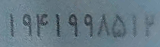

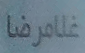

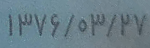

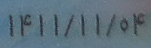

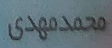

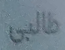

Label: National, Text: ۱۹۴۱۹۹۸۵۱, Confidence: 0.86822110414505
Label: Name, Text: مرضا, Confidence: 0.8477933406829834
Label: Birth, Text: ۱۲۷۶/۵۳/۲۷, Confidence: 0.834509015083313
Label: Expire, Text: ۱۴۱۱/۱۱/۰۴, Confidence: 0.8334735631942749
Label: FatherName, Text: محهدمهدی, Confidence: 0.8260750770568848
Label: LastName, Text: لبی, Confidence: 0.8109223246574402

0: 480x640 1 Card, 14.9ms
Speed: 5.1ms preprocess, 14.9ms inference, 3.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 Expire, 1 Name, 1 National, 17.8ms
Speed: 4.9ms preprocess, 17.8ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 640)


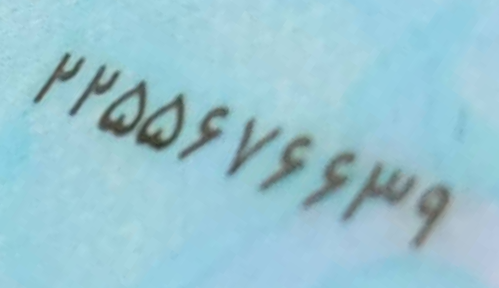

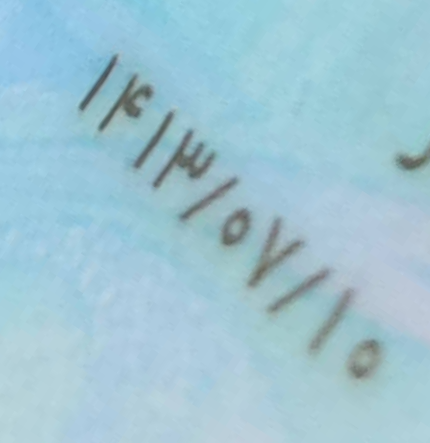

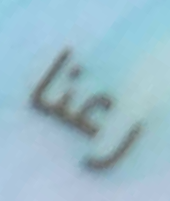

Label: National, Text: وعدوو/ل, Confidence: 0.6941534876823425
Label: Expire, Text: /ش, Confidence: 0.5762685537338257
Label: Name, Text: , Confidence: 0.5132891535758972
Error splitting Expire: /ش

0: 480x640 1 Card, 21.4ms
Speed: 6.1ms preprocess, 21.4ms inference, 5.2ms postprocess per image at shape (1, 3, 480, 640)


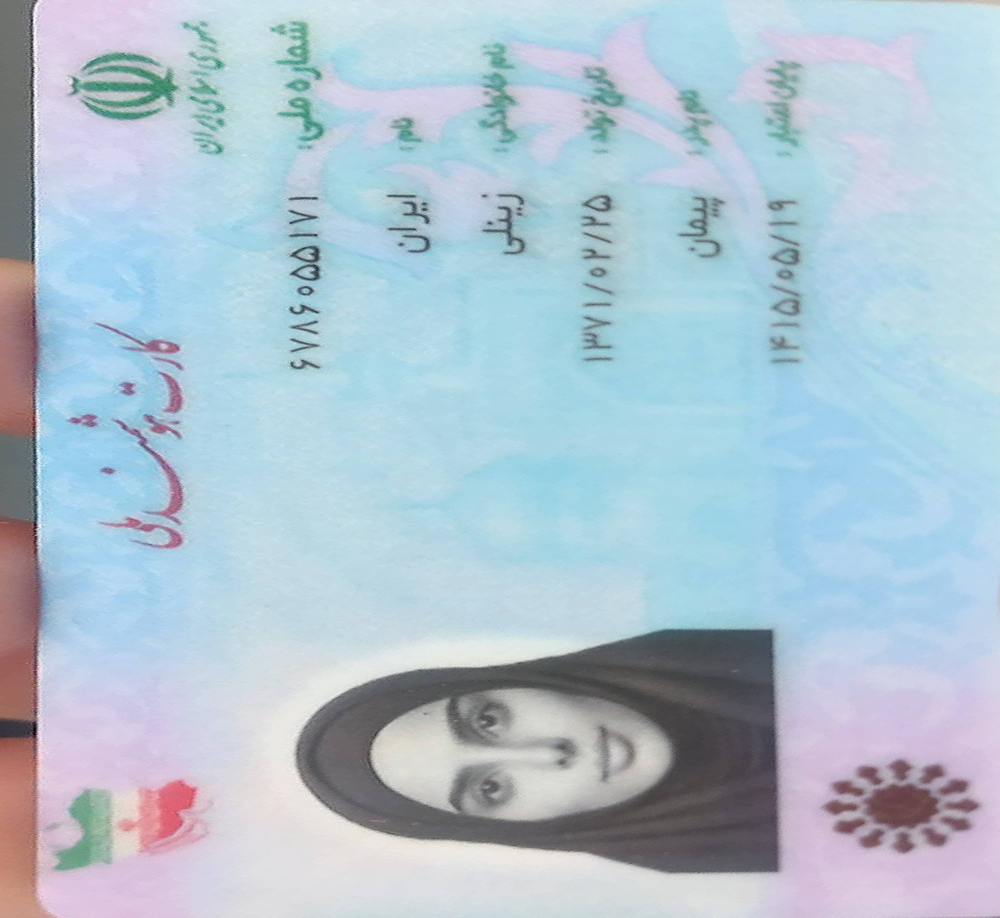


0: 608x640 1 Card, 112.9ms
Speed: 7.3ms preprocess, 112.9ms inference, 5.6ms postprocess per image at shape (1, 3, 608, 640)


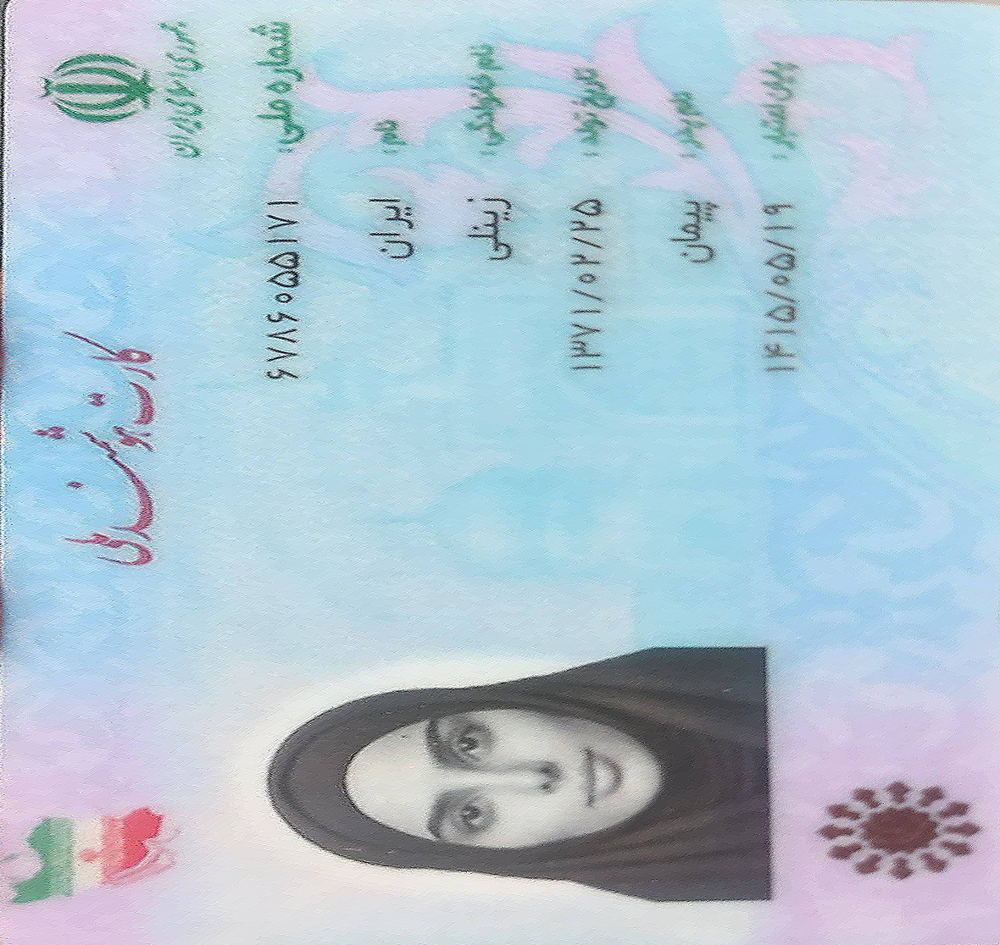


0: 608x640 1 Birth, 1 Expire, 1 FatherName, 1 LastName, 1 Name, 1 National, 53.0ms
Speed: 5.3ms preprocess, 53.0ms inference, 2.2ms postprocess per image at shape (1, 3, 608, 640)


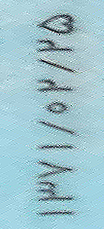

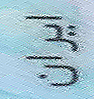

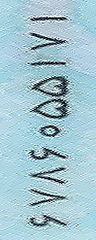

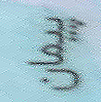

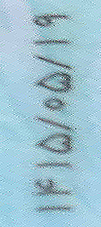

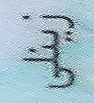

Label: Birth, Text: , Confidence: 0.8130940794944763
Label: Name, Text: ژ-ّ, Confidence: 0.7910932302474976
Label: National, Text: م, Confidence: 0.7856378555297852
Label: FatherName, Text: %ل, Confidence: 0.772920548915863
Label: Expire, Text: , Confidence: 0.7649041414260864
Label: LastName, Text: داّّ, Confidence: 0.7613999247550964
Error splitting Birth: 
Error splitting Expire: 

0: 480x640 1 Card, 26.9ms
Speed: 5.8ms preprocess, 26.9ms inference, 3.4ms postprocess per image at shape (1, 3, 480, 640)


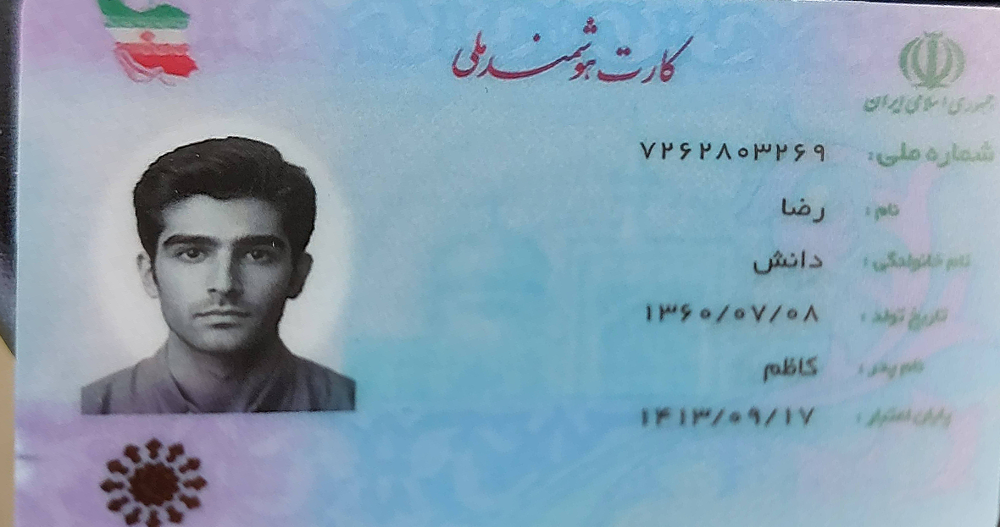


0: 352x640 1 Birth, 1 Expire, 1 FatherName, 1 LastName, 1 Name, 1 National, 12.0ms
Speed: 3.3ms preprocess, 12.0ms inference, 1.9ms postprocess per image at shape (1, 3, 352, 640)


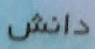

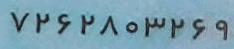

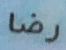

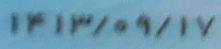

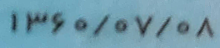

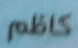

Label: LastName, Text: دانش, Confidence: 0.8688631057739258
Label: National, Text: ۷۲۶۲۸۰۳۲۶۹, Confidence: 0.8605316281318665
Label: Name, Text: رضا, Confidence: 0.8395256996154785
Label: Expire, Text: /۱۴۱۳/۰۱/۱, Confidence: 0.8363181352615356
Label: Birth, Text: ۱۳۶۰/۰۷/۰۸, Confidence: 0.8327898383140564
Label: FatherName, Text: %ا/ادم, Confidence: 0.8256542682647705
Error splitting Expire: /۱۴۱۳/۰۱/۱

0: 480x640 2 Cards, 14.2ms
Speed: 4.6ms preprocess, 14.2ms inference, 4.0ms postprocess per image at shape (1, 3, 480, 640)


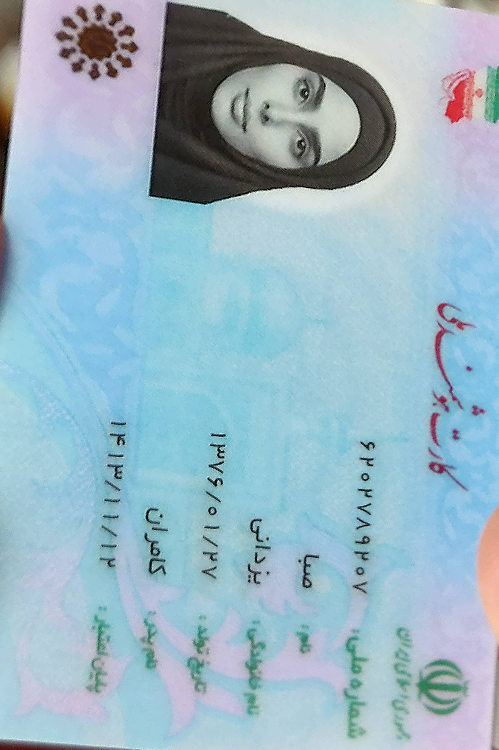


0: 640x448 1 Birth, 1 Expire, 1 FatherName, 1 LastName, 1 Name, 2 Nationals, 13.3ms
Speed: 3.7ms preprocess, 13.3ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 448)


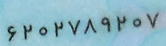

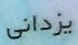

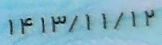

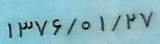

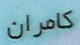

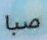

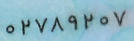

Label: National, Text: ۶۲۰۲۷۸۹۲۰۷, Confidence: 0.8508440852165222
Label: LastName, Text: یزدانی, Confidence: 0.8420901298522949
Label: Expire, Text: ۱۴۱۳/۱۱/۱۲, Confidence: 0.8376858830451965
Label: Birth, Text: ۱۳۷۶/۰۱/۲۷, Confidence: 0.8159952163696289
Label: FatherName, Text: کاهران, Confidence: 0.8012101650238037
Label: Name, Text: صبا, Confidence: 0.7772697806358337

0: 480x640 1 Card, 13.4ms
Speed: 4.5ms preprocess, 13.4ms inference, 3.6ms postprocess per image at shape (1, 3, 480, 640)


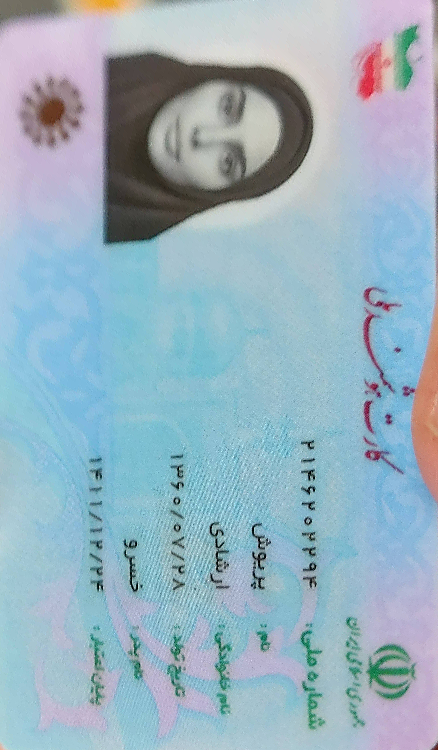


0: 640x384 1 Birth, 1 Expire, 1 FatherName, 1 LastName, 1 Name, 1 National, 14.3ms
Speed: 2.7ms preprocess, 14.3ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 384)


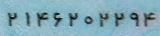

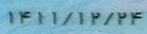

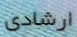

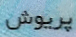

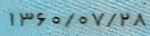

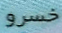

Label: National, Text: ۲۱۴۶۲۰۲۲۹۴, Confidence: 0.8535085320472717
Label: Expire, Text: ۱۴۱۱/۱۲/۲۴, Confidence: 0.850779116153717
Label: LastName, Text: ارشادی, Confidence: 0.8080142140388489
Label: Name, Text: پریوش, Confidence: 0.7903853058815002
Label: Birth, Text: ۱۳۶۵/۰۷/۲۸, Confidence: 0.7818707823753357
Label: FatherName, Text: خسرو, Confidence: 0.7802431583404541

0: 480x640 1 Card, 13.6ms
Speed: 4.4ms preprocess, 13.6ms inference, 3.5ms postprocess per image at shape (1, 3, 480, 640)


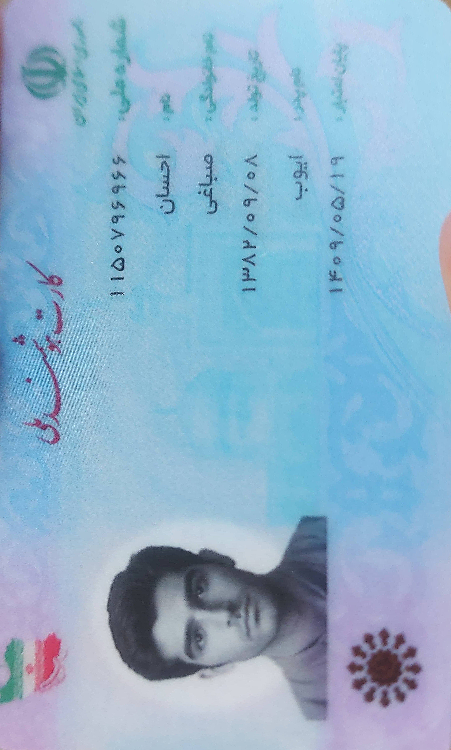


0: 640x416 1 Birth, 1 Expire, 1 FatherName, 1 LastName, 1 Name, 1 National, 79.2ms
Speed: 2.9ms preprocess, 79.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 416)


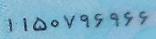

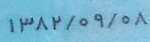

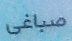

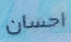

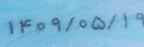

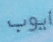

Label: National, Text: ۱۱۵۰۷۹۶۹۶۶, Confidence: 0.8411516547203064
Label: Birth, Text: ۱۳۸۲/۰۹/۰۸, Confidence: 0.822913408279419
Label: LastName, Text: صباغی, Confidence: 0.8220797777175903
Label: Name, Text: احسان, Confidence: 0.8113259673118591
Label: Expire, Text: ۱۴۰۹/۵/۱, Confidence: 0.7948431968688965
Label: FatherName, Text: یب, Confidence: 0.650687038898468

0: 480x640 1 Card, 19.0ms
Speed: 6.2ms preprocess, 19.0ms inference, 3.3ms postprocess per image at shape (1, 3, 480, 640)


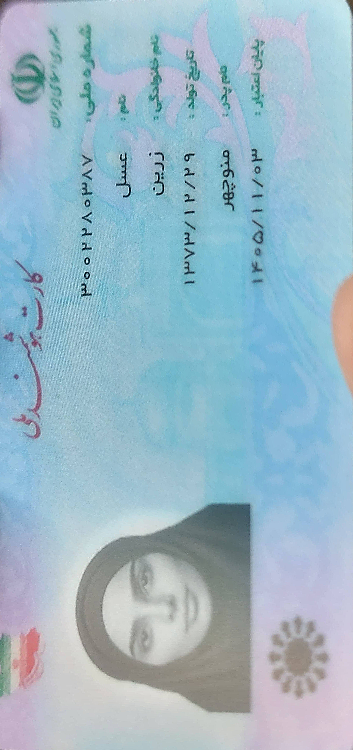


0: 640x320 1 Card, 15.7ms
Speed: 2.6ms preprocess, 15.7ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 320)


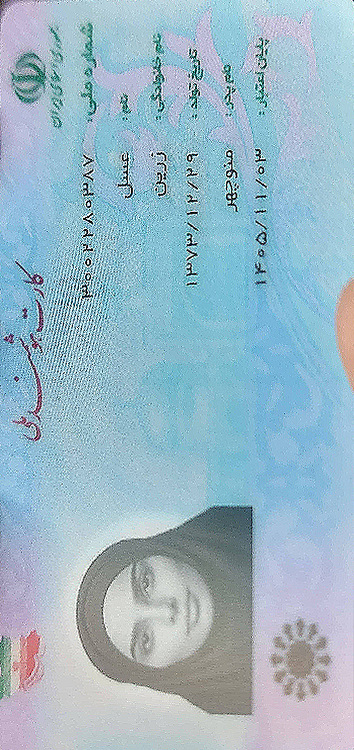


0: 640x320 1 Birth, 1 Expire, 1 FatherName, 1 LastName, 1 Name, 11.7ms
Speed: 2.8ms preprocess, 11.7ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 320)


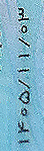

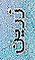

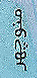

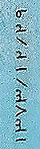

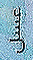

Label: Expire, Text: , Confidence: 0.7224583625793457
Label: LastName, Text: زؤّ, Confidence: 0.6460232734680176
Label: FatherName, Text: پلأ, Confidence: 0.6002148985862732
Label: Birth, Text: آ, Confidence: 0.5512796640396118
Label: Name, Text: ل, Confidence: 0.4294590353965759
Error splitting Expire: 
Error splitting Birth: آ
ذخیره نهایی: 9 داده در فایل اصلی


[{'image_id': '1070',
  'national_id': '۶۴،پالح%اه',
  'first_name': '',
  'last_name': '',
  'birth_year': '',
  'birth_month': '',
  'birth_day': '',
  'father_name': 'ا',
  'expiry_year': '',
  'expiry_month': '',
  'expiry_day': ''},
 {'image_id': '10',
  'national_id': '۱۹۴۱۹۹۸۵۱',
  'first_name': 'مرضا',
  'last_name': 'لبی',
  'birth_year': '۱۲۷۶',
  'birth_month': '۵۳',
  'birth_day': '۲۷',
  'father_name': 'محهدمهدی',
  'expiry_year': '۱۴۱۱',
  'expiry_month': '۱۱',
  'expiry_day': '۰۴'},
 {'image_id': '1064',
  'national_id': 'وعدوو/ل',
  'first_name': '',
  'last_name': '',
  'birth_year': '',
  'birth_month': '',
  'birth_day': '',
  'father_name': '',
  'expiry_year': '',
  'expiry_month': '',
  'expiry_day': ''},
 {'image_id': '2',
  'national_id': 'م',
  'first_name': 'ژ-ّ',
  'last_name': 'داّّ',
  'birth_year': '',
  'birth_month': '',
  'birth_day': '',
  'father_name': '%ل',
  'expiry_year': '',
  'expiry_month': '',
  'expiry_day': ''},
 {'image_id': '1022',
  'nati

In [15]:
detect('/content/NationalCard-ImageProccessing/hard_image')

# Sort csv

In [16]:
df = pd.read_csv('image_phase2.csv')
df = df.sort_values(by='image_id')
df.to_csv("image_phase2.csv", index=False)

In [12]:
df # before change the rotate function

,image_id,national_id,first_name,last_name,birth_year,birth_month,birth_day,father_name,expiry_year,expiry_month,expiry_day
7,1,۱۱۵۰۱۹۶۹۰,حسد,عبثی,NaN,NaN,NaN,ی,NaN,NaN,NaN
3,2,۶۷۸۶۰۵۵۱۷۱,ایران,زینلی,NaN,NaN,NaN,رمار,NaN,NaN,NaN
1,10,عچ,ی,ف,NaN,NaN,NaN,چ,NaN,NaN,NaN
8,11,NaN,لأ,ئدّ,NaN,NaN,NaN,بلق,NaN,NaN,NaN
4,1022,صغ ۷م۳-ر۲۰۰۰,دض,NaN,۶۶ت-,۰۷,-۱۳۰,ماامم,۰۰۰۳,۰۶,۰۶
2,1064,۰۲۵۵۶۷۶۶۳۹,NaN,االعائی,NaN,NaN,NaN,ر,NaN,NaN,NaN
0,1070,م عسحی,NaN,NaN,NaN,NaN,NaN,هحز,NaN,NaN,NaN
5,1084,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,1092,چ,ؤ,ن؟,NaN,NaN,NaN,أأ,NaN,NaN,NaN


In [17]:
df # after change the rotate function

,image_id,national_id,first_name,last_name,birth_year,birth_month,birth_day,father_name,expiry_year,expiry_month,expiry_day
7,1,۱۱۵۰۷۹۶۹۶۶,احسان,صباغی,۱۳۸۲,۰۹,۰۸,یب,۱۴۰۹,۵,۱
3,2,م,ژ-ّ,داّّ,NaN,NaN,NaN,%ل,NaN,NaN,NaN
1,10,۱۹۴۱۹۹۸۵۱,مرضا,لبی,۱۲۷۶,۵۳,۲۷,محهدمهدی,۱۴۱۱,۱۱,۰۴
8,11,NaN,ل,زؤّ,NaN,NaN,NaN,پلأ,NaN,NaN,NaN
4,1022,۷۲۶۲۸۰۳۲۶۹,رضا,دانش,۱۳۶۰,۰۷,۰۸,%ا/ادم,NaN,NaN,NaN
2,1064,وعدوو/ل,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,1070,۶۴،پالح%اه,NaN,NaN,NaN,NaN,NaN,ا,NaN,NaN,NaN
5,1084,۶۲۰۲۷۸۹۲۰۷,صبا,یزدانی,۱۳۷۶,۰۱,۲۷,کاهران,۱۴۱۳,۱۱,۱۲
6,1092,۲۱۴۶۲۰۲۲۹۴,پریوش,ارشادی,۱۳۶۵,۰۷,۲۸,خسرو,۱۴۱۱,۱۲,۲۴
